# Base de Dados e Gráficos para o Website

Nesse notebook vamos criar uma base de dados em `SQLite` e um website com `Flask` para armazenar e visualizar as informações buscadas, respectivamente.

**Vamos começar com alguns imports e testando o funcionamento das funções no script <font color='blue'> scrape_scholar.py</font>**

In [1]:
%matplotlib inline

import sqlite3                # database
import pandas as pd
import altair as alt
#import networkx as nx         # graph
import nx_altair as nxa       # graph with altair
import matplotlib.pyplot as plt

from flask import Flask       # website
from scrape_scholar import *  # scrape_scholar.py functions

Your working directory is set to: /media/franklin/Arquivos/EMAp/2º Trimestre/Data Science/FDS-Repo/hw1

Make sure that chomedriver is at this location.


In [2]:
# retorna uma tupla (URL, source)
data = scrape('Jeffrey Heer')

Dados coletados. Verifique código html na variável source.


In [3]:
# faz o parser do código HTML e retorna uma lista [{titulo:'Artigo1', autores:'Autor1,Autor2'}]
papers = find_papers_and_authors(data[1])

/media/franklin/Arquivos/EMAp/2º Trimestre/Data Science/FDS-Repo/hw1/scrape_scholar.py:270: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("lxml"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 270 of the file /media/franklin/Arquivos/EMAp/2º Trimestre/Data Science/FDS-Repo/hw1/scrape_scholar.py. To get rid of this warning, pass the additional argument 'features="lxml"' to the BeautifulSoup constructor.

  html = bs4.BeautifulSoup(scholar_source)


In [5]:
# criando um dataframe flat (separando cada autor em uma linha diferente, para um mesmo artigo)
flat = []
for paper in papers:
    for author in paper['autores']:
        flat.append([paper['titulo'],author.strip()])
        
flat_df = pd.DataFrame(flat, columns=['titulo','autor'])
flat_df.head(2)

,titulo,autor
0,D3: Data-Driven Documents,M Bostock
1,D3: Data-Driven Documents,V Ogievetsky


In [6]:
# lista de artigos
titulos = [paper['titulo'].strip() for paper in papers]

# lista de autores
autores = [autor.strip() for autores in 
            [paper['autores'] for paper in papers] for autor in autores]

# ordenando e removendo duplicados 
autores = sorted(set(autores))

In [7]:
# linhas duplicadas (mesmo artigo com os mesmos autores que aparecem mais de uma vez)
flat_df[flat_df.duplicated()]

,titulo,autor
493,Seeing the invisible,J Heer
494,Seeing the invisible,P Khooshabeh
598,An Algorithm and Analysis of Social Topologies...,J Heer


## Criando a base de dados

In [8]:
# código para criar as tabelas 
structure = '''
DROP TABLE IF EXISTS "author";
DROP TABLE IF EXISTS "paper";
DROP TABLE IF EXISTS "author_paper";
CREATE TABLE "author" (
    "id" INTEGER PRIMARY KEY  NOT NULL ,
    "name" VARCHAR NOT NULL UNIQUE
);
CREATE TABLE "paper" (
    "id" INTEGER PRIMARY KEY  NOT NULL ,
    "title" VARCHAR NOT NULL UNIQUE
);
CREATE TABLE "author_paper" (
    id_paper VARCHAR,
    id_author VARCHAR,
    FOREIGN KEY(id_paper) REFERENCES paper(id)
    FOREIGN KEY(id_author) REFERENCES author(id)
);
'''

In [9]:
# criando o arquivo .db
connect = sqlite3.connect('hw1.sqlite',timeout=10)
cursor = connect.cursor()
cursor.executescript(structure)
connect.commit()
connect.close()

### Adicionando autores

In [10]:
add_autor = '''
INSERT OR IGNORE INTO author (name) VALUES (?);
'''

connect = sqlite3.connect('hw1.sqlite',timeout=10)
for autor in autores:
    connect.execute(add_autor, [autor])
connect.commit()
connect.close()

### Adicionando artigos

In [11]:
add_titulo = '''
INSERT OR IGNORE INTO paper (title) VALUES (?);
'''

connect = sqlite3.connect('hw1.sqlite',timeout=10)
for titulo in titulos:
    connect.execute(add_titulo,[titulo])
connect.commit()
connect.close()

### Criando uma tabela de IDs 

Nesse passo, vamos criar uma tabela apenas com os IDs. Ela terá a seguinte estrutura:

|ID_Artigo| ID_Autor|
|:-------:|:-------:|
| ID_art1 | ID_aut1 |
| ID_art2 | ID_aut2 |
| ID_art3 | ID_aut3 |

In [12]:
# coletando os IDs: Autores
connect = sqlite3.connect('hw1.sqlite',timeout=10)

autores = []
autores_table = connect.execute('SELECT * from author')

for autor in autores_table:
    autores.append(autor)

connect.close()

autores = pd.DataFrame(autores, columns=['ID_author','author'])
autores.head(2)

,ID_author,author
0,1,A Anand
1,2,A Borning


In [36]:
# coletando os IDs: Artigos
connect = sqlite3.connect('hw1.sqlite',timeout=10)

artigos = []
artigos_table = connect.execute('SELECT * from paper')

for artigo in artigos_table:
    artigos.append(artigo)

connect.close()

artigos = pd.DataFrame(artigos, columns=['ID_paper','paper'])
artigos.head(2)

,ID_paper,paper
0,1,D3: Data-Driven Documents
1,2,Prefuse: a toolkit for interactive information...


In [14]:
flat_df.rename(columns={'titulo':'paper','autor':'author'}, inplace=True)

In [15]:
autores_e_artigos = pd.merge(flat_df,artigos,on='paper')  # adicionando coluna de ID_Artigo
autores_e_artigos = pd.merge(autores_e_artigos,autores,on='author') # adicionando coluna ID_Autor
autores_e_artigos.head()

,paper,author,ID_paper,ID_author
0,D3: Data-Driven Documents,M Bostock,1,163
1,Crowdsourcing graphical perception: using mech...,M Bostock,5,163
2,A tour through the visualization zoo.,M Bostock,7,163
3,Protovis: A graphical toolkit for visualization,M Bostock,11,163
4,Declarative language design for interactive vi...,M Bostock,43,163


<br>

**Adicionando os IDs à tabela autores_e_artigos em `SQLite`**

In [16]:
add_autor_e_artigo ='''
INSERT INTO author_paper (id_paper, id_author) VALUES (?,?);
'''

connect = sqlite3.connect('hw1.sqlite',timeout=10)
for ID,obs in autores_e_artigos.iterrows():
    connect.execute(add_autor_e_artigo,[obs['ID_paper'],obs['ID_author']])
connect.commit()
connect.close()

### Fazendo *querys*

Agora que o banco de dados já está criado, vamos fazer *querys* para alimentar os gráficos que virão na próxima etapa.

In [17]:
query = ' SELECT * FROM {}'

connect = sqlite3.connect('hw1.sqlite', timeout=10)
author_paper = []
for obs in connect.execute(query.format('author_paper')):
    author_paper.append(obs)
connect.close()

author_paper = pd.DataFrame(author_paper, columns=['ID_paper','ID_author'])
author_paper.head(2)

,ID_paper,ID_author
0,1,163
1,5,163


<br>

## Visualizações

Nesse passo, vamos usar o `Altair` em conjunto com a biblioteca `Networkx` para criar as visualizações.

### Grafo 1: Autores

In [95]:
graph = nx.Graph()

In [96]:
group = pd.DataFrame(author_paper.groupby('ID_paper')['ID_author'].apply(list))

In [98]:
# Adicionando "edges"
for j,row in group.iterrows():
    i=len(row['ID_author'])
    for i in range(len(row['ID_author'])):
        for k in range(i,len(row['ID_author'])):
            graph.add_edge(row['ID_author'][i], row['ID_author'][k])

In [65]:
# coletando labels
autores['ID_author'] = autores['ID_author'].astype(str)
labels = autores.set_index('ID_author').to_dict()['author']

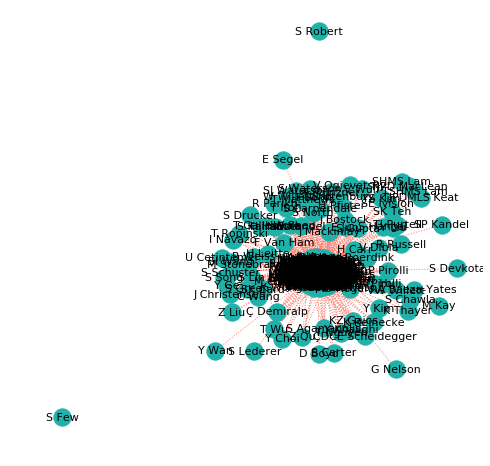

In [70]:
plt.figure(figsize=(8, 8))

pos = nx.spring_layout(graph,k=0.2, iterations=50, weight=0.1, center=(0.5,0.5))
nx.draw_networkx(graph,pos= pos,  labels=labels, node_color='lightseagreen', edge_color='salmon',
                style="dotted", font_size=11)

#plt.title('Authors',{'fontsize':14})
plt.axis('off')

plt.savefig('static/img/authors.png')

### Grafo 2: Papers

In [160]:
graph1 = nx.Graph()
group1 = pd.DataFrame(author_paper.groupby('ID_author')['ID_paper'].apply(list))

In [161]:
# Adicionando "edges"
for j,row in group1.iterrows():
    i=len(row['ID_paper'])
    for i in range(len(row['ID_paper'])):
        for k in range(i,len(row['ID_paper'])):
            graph1.add_edge(row['ID_paper'][i], row['ID_paper'][k])

In [162]:
# coletando labels
artigos['ID_paper'] = artigos['ID_paper'].astype(str)
labels1 = artigos.set_index('ID_paper').to_dict()['paper']

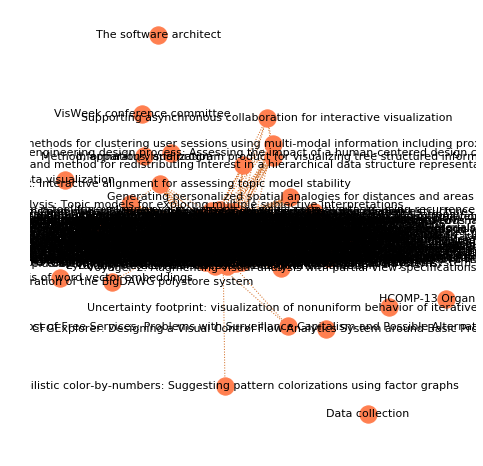

In [164]:
plt.figure(figsize=(8, 8))

pos1 = nx.spring_layout(graph1,k=0.2, iterations=50, weight=0.1, center=(0.5,0.5))
nx.draw_networkx(graph1,pos= pos,  labels=labels1, node_color='coral', edge_color='chocolate',
                style="dotted", font_size=11)

#plt.title('Papers',{'fontsize':14})
plt.axis('off')

plt.savefig('static/img/papers.png')

### Tornando os gráficos interativos com o `Altair`

In [73]:
a = pd.DataFrame(pos.values(), columns=['edge_x','edge_y'])
a['label'] = list(labels.values())

In [75]:
a.head()

,edge_x,edge_y,label
0,0.517094,0.529320,A Anand
1,0.609523,0.848477,A Borning
2,0.519262,0.541637,A Chhajta
3,0.438191,0.675534,A Elmore
4,0.474091,0.508834,A Jang


In [139]:
group1['author'] = pd.Series(names, index=group1.index)

In [125]:
alt.data_transformers.disable_max_rows()
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [36]:
a = pd.DataFrame(pos.values(), columns=['edge_x','edge_y'])
a['label'] = list(labels.values())

In [202]:
teste = nxa.draw_networkx_edges(graph,pos= pos, node_color='lightseagreen',node_size=100,
                        edge_color='salmon') + nxa.draw_networkx_nodes(graph,pos= pos, node_color='lightseagreen',node_size=100,
                        edge_color='salmon') 


In [80]:
def to_pandas_edges(G, pos, **kwargs):
    """Convert Graph edges to pandas DataFrame that's readable to Altair.
    """
    # Get all attributes in nodes
    attributes = ['source', 'target', 'x', 'y', 'edge', 'pair']
    for e in G.edges():
        attributes += list(G.edges[e].keys())
    attributes = list(set(attributes))


    # Build a dataframe for all edges and their attributes
    df = pd.DataFrame(
        index=range(G.size()*2),
        columns=attributes
    )


    # Add node data to dataframe.
    for i, e in enumerate(G.edges):
        idx = i*2

        data1 = dict(
            edge=i,
            source=e[0],
            target=e[1],
            pair=e,
            x=pos[e[0]][0],
            y=pos[e[0]][1],
            **G.edges[e]
        )

        data2 = dict(
            edge=i,
            source=e[0],
            target=e[1],
            pair=e,
            x=pos[e[1]][0],
            y=pos[e[1]][1],
            **G.edges[e]
        )

        df.loc[idx] = data1
        df.loc[idx+1] = data2

    return df

In [81]:
def to_pandas_nodes(G, pos):
    """Convert Graph nodes to pandas DataFrame that's readable to Altair.
    """
    # Get all attributes in nodes
    attributes = ['x', 'y']
    for n in G.nodes():
        attributes += list(G.nodes[n].keys())
    attributes = list(set(attributes))

    # Build a dataframe for all nodes and their attributes
    df = pd.DataFrame(
        index=G.nodes(),
        columns=attributes
    )

    # Add node data to dataframe.
    for n in G.nodes:
        data = dict(
            x=pos[n][0],
            y=pos[n][1],
            **G.nodes[n]
        )
        df.loc[n] = data

    return df

In [120]:
nodes = to_pandas_nodes(graph,pos)

In [121]:
nodes.reset_index(inplace=True)

In [122]:
nodes.rename(columns={'index':'ID_author'}, inplace=True)

In [123]:
nodes = pd.merge(nodes,autores,on='ID_author')
nodes.head()

,ID_author,x,y,author
0,163,0.517094,0.52932,M Bostock
1,261,0.609523,0.848477,V Ogievetsky
2,123,0.519262,0.541637,J Heer
3,231,0.438191,0.675534,S Kandel
4,11,0.474091,0.508834,A Paepcke


In [117]:
edges = to_pandas_edges(graph,pos)

In [118]:
edges.head()

,edge,source,target,pair,x,y
0,0,163,163,"(163, 163)",0.517094,0.52932
1,0,163,163,"(163, 163)",0.517094,0.52932
2,1,163,261,"(163, 261)",0.517094,0.52932
3,1,163,261,"(163, 261)",0.609523,0.848477
4,2,163,123,"(163, 123)",0.517094,0.52932


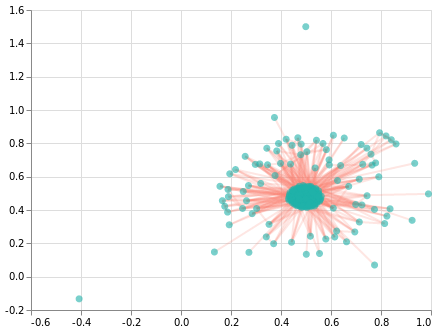

In [191]:
points = alt.Chart(nodes).mark_point(color='lightseagreen', fill='lightseagreen',size=50).encode(
       alt.X('x', axis=alt.Axis(title='')),
    alt.Y('y', axis=alt.Axis(title='')),
    tooltip='author',
    opacity=alt.value(0.6)
)

lines = alt.Chart(edges).mark_line(color='salmon').encode(
       alt.X('x', axis=alt.Axis(title='')),
    alt.Y('y', axis=alt.Axis(title='')),
    detail='edge',
    opacity=alt.value(0.2)
)

chart = alt.LayerChart(layer=(lines,points))

chart

In [175]:
nodes1 = to_pandas_nodes(graph1, pos1)

In [176]:
nodes1.reset_index(inplace=True)

In [177]:
nodes1.rename(columns={'index':'ID_paper'}, inplace=True)

In [178]:
nodes1 = pd.merge(nodes1,artigos,on='ID_paper')
nodes1.head()

,ID_paper,x,y,paper
0,24,0.489581,0.553171,Voyager: Exploratory analysis via faceted brow...
1,66,0.471407,0.365526,Voyager 2: Augmenting visual analysis with par...
2,95,0.531071,0.514954,Towards a general-purpose query language for v...
3,179,0.495528,0.513277,Readings Covered
4,69,0.486048,0.53872,liquid: Context-aware distributed queries


In [179]:
edges1 = to_pandas_edges(graph1,pos1)

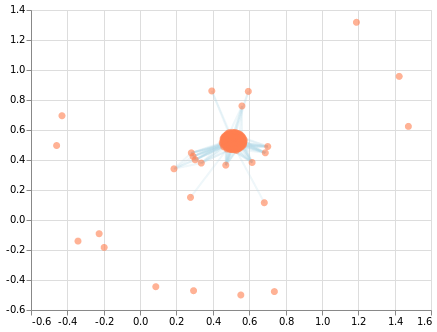

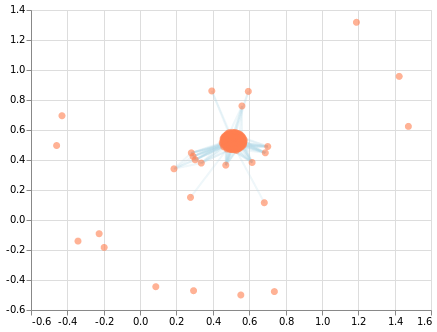

In [192]:
points1 = alt.Chart(nodes1).mark_point(color='coral', fill='coral',size=50).encode(
       alt.X('x', axis=alt.Axis(title='')),
    alt.Y('y', axis=alt.Axis(title='')),
    tooltip='paper',
    opacity=alt.value(0.6)
)

lines1 = alt.Chart(edges1).mark_line(color='lightblue', style='--').encode(
       alt.X('x', axis=alt.Axis(title='')),
    alt.Y('y', axis=alt.Axis(title='')),
    detail='edge',
    opacity=alt.value(0.2)
)

chart1 = alt.LayerChart(layer=(lines1,points1))

chart1

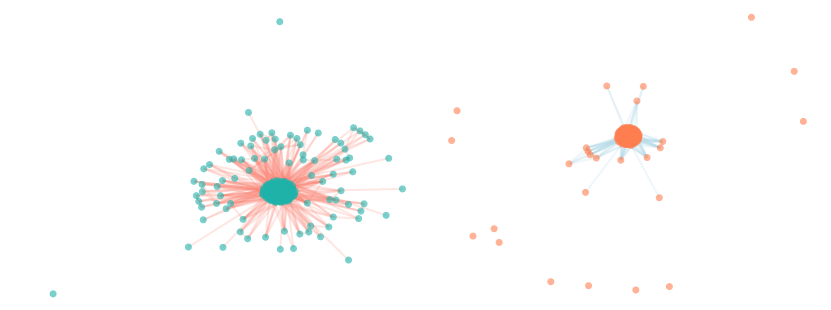

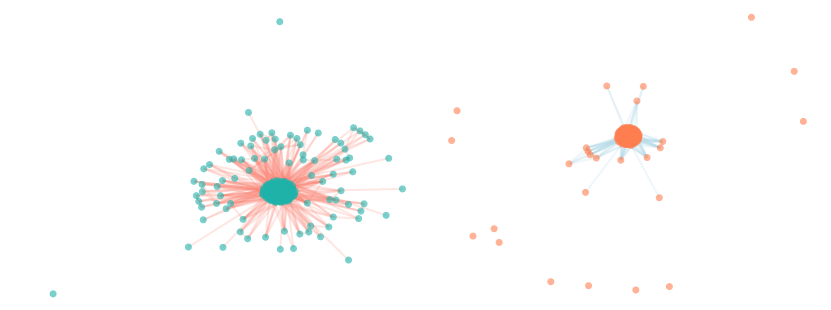

In [193]:
g = alt.hconcat(chart, chart1 ).configure_axis( ticks=False,
        grid=False,
        domain=False,
        labels=False).configure_view(
    strokeWidth=0
)
g

### Exemplo de como construir um grafo com `Plotly`

Abaixo, segue um exemplo/tentativa de construir um grafo com o pacote `Plotly`. No entanto, a versão entregue desse projeto será feita com a biblioteca `Altair` (requisitada pelo professor).

In [ ]:
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
a = pd.DataFrame(pos.values(), columns=['edge_x','edge_y'])
a['label'] = list(labels.values())

In [193]:
edge_trace = go.Scatter(
    x=list(a['edge_x']), y=list(a['edge_y']),
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

In [194]:
node_x=list(a['edge_x'])
node_y=list(a['edge_y'])

In [195]:
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    text=list(labels.values()),
    hoverinfo='text',
    marker=dict(
        showscale=False,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color='lightseagreen',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [196]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Authors',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()

## Criando o website

Nessa etapa, vamos usar o `Flask` para renderizar o website. 

<font color='red' size=5>**Inserir instruções**</font>

https://code.tutsplus.com/pt/tutorials/an-introduction-to-pythons-flask-framework--net-28822

In [353]:
from flask import Flask, render_template, escape, request

app = Flask(__name__)

 
@app.route('/')
def home():
    return render_template('home.html')
 
if __name__ == '__main__':
    app.run(debug=True)

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


OSError: [Errno 98] Address already in use